<a href="https://colab.research.google.com/github/AshleyHeinrich/Sales-Predictions/blob/main/Sales_Predictions_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sales Predictions

Ashley Heinrich

* Exploring and Cleaning the Data. 
* Identifying missing values, duplicate columns 
* Amending categorical inconsistencies. 
* Exploratory and Explanatory Visuals 

## Loading Data

In [189]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

filename = ('Data/sales_predictions - sales_predictions.csv')
sales_df = pd.read_csv(filename)
sales_df

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.3000,Low Fat,0.0160,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,"3,735.1380"
1,DRC01,5.9200,Regular,0.0193,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.5000,Low Fat,0.0168,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,"2,097.2700"
3,FDX07,19.2000,Regular,0.0000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.9300,Low Fat,0.0000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052
5,FDP36,10.3950,Regular,0.0000,Baking Goods,51.4008,OUT018,2009,Medium,Tier 3,Supermarket Type2,556.6088
6,FDO10,13.6500,Regular,0.0127,Snack Foods,57.6588,OUT013,1987,High,Tier 3,Supermarket Type1,343.5528
7,FDP10,NaN,Low Fat,0.1275,Snack Foods,107.7622,OUT027,1985,Medium,Tier 3,Supermarket Type3,"4,022.7636"
8,FDH17,16.2000,Regular,0.0167,Frozen Foods,96.9726,OUT045,2002,NaN,Tier 2,Supermarket Type1,"1,076.5986"
9,FDU28,19.2000,Regular,0.0944,Frozen Foods,187.8214,OUT017,2007,NaN,Tier 2,Supermarket Type1,"4,710.5350"


## Data Cleaning


**Explore Data**

In [190]:
sales_df.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.3000,Low Fat,0.0160,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,"3,735.1380"
1,DRC01,5.9200,Regular,0.0193,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.5000,Low Fat,0.0168,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,"2,097.2700"
3,FDX07,19.2000,Regular,0.0000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.9300,Low Fat,0.0000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [191]:
sales_df.tail()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
8518,FDF22,6.8650,Low Fat,0.0568,Snack Foods,214.5218,OUT013,1987,High,Tier 3,Supermarket Type1,"2,778.3834"
8519,FDS36,8.3800,Regular,0.0470,Baking Goods,108.1570,OUT045,2002,NaN,Tier 2,Supermarket Type1,549.2850
8520,NCJ29,10.6000,Low Fat,0.0352,Health and Hygiene,85.1224,OUT035,2004,Small,Tier 2,Supermarket Type1,"1,193.1136"
8521,FDN46,7.2100,Regular,0.1452,Snack Foods,103.1332,OUT018,2009,Medium,Tier 3,Supermarket Type2,"1,845.5976"
8522,DRG01,14.8000,Low Fat,0.0449,Soft Drinks,75.4670,OUT046,1997,Small,Tier 1,Supermarket Type1,765.6700


In [192]:
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


1. There are 12 columns and 8523 rows 
2. The datatypes are objects, integers and floats
3. Data types appropriate for the information in each column. **bold text**

In [193]:
sales_df.nunique()

Item_Identifier              1559
Item_Weight                   415
Item_Fat_Content                5
Item_Visibility              7880
Item_Type                      16
Item_MRP                     5938
Outlet_Identifier              10
Outlet_Establishment_Year       9
Outlet_Size                     3
Outlet_Location_Type            3
Outlet_Type                     4
Item_Outlet_Sales            3493
dtype: int64

1. Examine the number of unique values in columns
2. Item_Identifier, Item_Visibility, Item_MRP, and Item_Outlet_Sales have many unique values
3. Fat_Content, Item_Type, _Outlet_Identifier, Establishment Year, Size and Type have fewer

**Check for Duplicates**

In [194]:
sales_df.duplicated().sum()

0

No duplicates present

**Inspecting Categorical Columns and Addressing Inconsistencies**

In [195]:
sales_df['Item_Identifier'].value_counts()

FDW13    10
FDG33    10
NCY18     9
FDD38     9
DRE49     9
FDV60     9
NCQ06     9
FDF52     9
FDX04     9
NCJ30     9
FDV38     9
NCF42     9
FDT07     9
FDW26     9
NCL31     9
FDU12     9
FDG09     9
FDQ40     9
FDX20     9
NCI54     9
FDX31     9
FDP25     9
FDW49     9
FDF56     9
FDO19     9
DRN47     9
NCB18     9
FDE11     8
NCX05     8
FDQ39     8
FDT55     8
FDO32     8
FDT40     8
FDZ20     8
FDH27     8
FDY49     8
FDS33     8
FDR04     8
FDR43     8
FDR59     8
FDJ55     8
FDT24     8
FDY55     8
FDV09     8
FDU23     8
FDY47     8
DRD25     8
FDK58     8
FDL58     8
FDX58     8
FDR44     8
FDP28     8
FDA39     8
FDH28     8
DRF27     8
FDX21     8
FDY56     8
FDF05     8
FDL20     8
FDY03     8
NCK05     8
FDS55     8
DRA59     8
FDG24     8
NCE54     8
FDZ21     8
FDA04     8
FDW24     8
FDT49     8
DRF23     8
FDD05     8
FDH10     8
FDX50     8
FDT32     8
FDK20     8
FDU13     8
FDN56     8
FDZ26     8
FDL34     8
DRF01     8
FDG38     8
NCE31     8
NCL53     8
NCB3

* Examining object type columns and verifying correct data type.  
* Looking for inconsistent categories of data
* Appropriate 


**Standardizing for Consistency**

In [196]:
sales_df['Item_Fat_Content'].value_counts()

Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64

In [197]:
fat_content_map = {'LF': 'Low Fat',
                   'low fat': 'Low Fat',
                   'reg': 'Regular',
                   'Low Fat': 'Low Fat',
                   'Regular': 'Regular'}

sales_df['Item_Fat_Content'] = sales_df['Item_Fat_Content'].replace (fat_content_map)
sales_df['Item_Fat_Content'].value_counts()

Low Fat    5517
Regular    3006
Name: Item_Fat_Content, dtype: int64

In [198]:
sales_df['Item_Type'].value_counts()

Fruits and Vegetables    1232
Snack Foods              1200
Household                 910
Frozen Foods              856
Dairy                     682
Canned                    649
Baking Goods              648
Health and Hygiene        520
Soft Drinks               445
Meat                      425
Breads                    251
Hard Drinks               214
Others                    169
Starchy Foods             148
Breakfast                 110
Seafood                    64
Name: Item_Type, dtype: int64

In [199]:
sales_df['Outlet_Identifier'].value_counts()

OUT027    935
OUT013    932
OUT049    930
OUT046    930
OUT035    930
OUT045    929
OUT018    928
OUT017    926
OUT010    555
OUT019    528
Name: Outlet_Identifier, dtype: int64

In [200]:
sales_df['Outlet_Size'].value_counts()

Medium    2793
Small     2388
High       932
Name: Outlet_Size, dtype: int64

In [201]:
#Change High to Large
sales_df['Outlet_Size'] = sales_df['Outlet_Size'].replace('High', 'Large')
sales_df['Outlet_Size'].value_counts()

Medium    2793
Small     2388
Large      932
Name: Outlet_Size, dtype: int64

In [202]:
sales_df['Outlet_Location_Type'].value_counts()

Tier 3    3350
Tier 2    2785
Tier 1    2388
Name: Outlet_Location_Type, dtype: int64

In [203]:
sales_df['Outlet_Type'].value_counts()

Supermarket Type1    5577
Grocery Store        1083
Supermarket Type3     935
Supermarket Type2     928
Name: Outlet_Type, dtype: int64

**Missing Values**

In [204]:
# Identify Missing 
## Missing 1463 in Item_Weight
## Missing 2410 in Outlet_Size
sales_df.isna().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

In [205]:
sales_df[sales_df.isna().any(axis = 1)]

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
3,FDX07,19.2000,Regular,0.0000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
7,FDP10,NaN,Low Fat,0.1275,Snack Foods,107.7622,OUT027,1985,Medium,Tier 3,Supermarket Type3,"4,022.7636"
8,FDH17,16.2000,Regular,0.0167,Frozen Foods,96.9726,OUT045,2002,NaN,Tier 2,Supermarket Type1,"1,076.5986"
9,FDU28,19.2000,Regular,0.0944,Frozen Foods,187.8214,OUT017,2007,NaN,Tier 2,Supermarket Type1,"4,710.5350"
18,DRI11,NaN,Low Fat,0.0342,Hard Drinks,113.2834,OUT027,1985,Medium,Tier 3,Supermarket Type3,"2,303.6680"
21,FDW12,NaN,Regular,0.0354,Baking Goods,144.5444,OUT027,1985,Medium,Tier 3,Supermarket Type3,"4,064.0432"
23,FDC37,NaN,Low Fat,0.0576,Baking Goods,107.6938,OUT019,1985,Small,Tier 1,Grocery Store,214.3876
25,NCD06,13.0000,Low Fat,0.0999,Household,45.9060,OUT017,2007,NaN,Tier 2,Supermarket Type1,838.9080
28,FDE51,5.9250,Regular,0.1615,Dairy,45.5086,OUT010,1998,NaN,Tier 3,Grocery Store,178.4344
29,FDC14,NaN,Regular,0.0722,Canned,43.6454,OUT019,1985,Small,Tier 1,Grocery Store,125.8362


**Addressing Missing Values**

1. Taking the mean weight for missing values in Item_Weight column
2. Filling in with 'Missing' for the missing values in Outlet_Size column. 

In [206]:
mean_weight = sales_df['Item_Weight'].mean()
mean_weight


12.857645184135976

In [207]:
sales_df['Item_Weight'].fillna(mean_weight, inplace=True)


In [208]:
sales_df['Outlet_Size'].fillna('Missing', inplace=True)


In [209]:
sales_df.isna().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
Item_Outlet_Sales            0
dtype: int64

* All missing values have been addressed. 

**Summary Statistics For Numerical Columns**

In [210]:
sales_df.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,"8,523.0000","8,523.0000","8,523.0000","8,523.0000","8,523.0000"
mean,12.8576,0.0661,140.9928,"1,997.8319","2,181.2889"
std,4.2261,0.0516,62.2751,8.3718,"1,706.4996"
min,4.5550,0.0000,31.2900,"1,985.0000",33.2900
25%,9.3100,0.0270,93.8265,"1,987.0000",834.2474
50%,12.8576,0.0539,143.0128,"1,999.0000","1,794.3310"
75%,16.0000,0.0946,185.6437,"2,004.0000","3,101.2964"
max,21.3500,0.3284,266.8884,"2,009.0000","13,086.9648"


## Exploratory Visuals

In [211]:
sales_df.dtypes

Item_Identifier               object
Item_Weight                  float64
Item_Fat_Content              object
Item_Visibility              float64
Item_Type                     object
Item_MRP                     float64
Outlet_Identifier             object
Outlet_Establishment_Year      int64
Outlet_Size                   object
Outlet_Location_Type          object
Outlet_Type                   object
Item_Outlet_Sales            float64
dtype: object

**Outlet Sales Distribution Visualizatio**n 

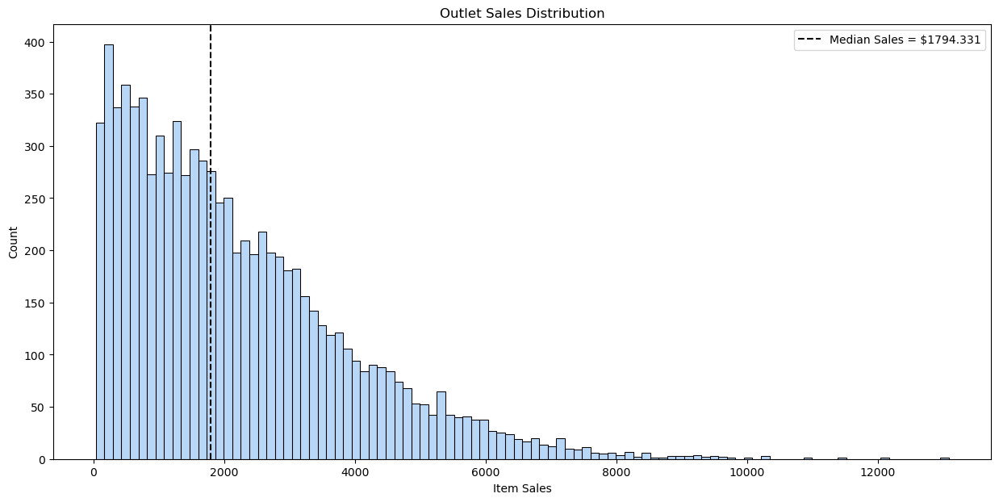

In [212]:
sns.set_palette('pastel')

plt.figure(figsize = (15,7))
ax = sns.histplot(data = sales_df, x = 'Item_Outlet_Sales', bins=100);


ax.set(title = 'Outlet Sales Distribution', xlabel = 'Item Sales')

median = sales_df['Item_Outlet_Sales'].median()

ax.axvline(median, color = 'black', ls = '--',
           label = f'Median Sales = ${median}')

ax.legend();


* Outlet Sales distribution is right skewed 
*  Most sales occur around median and below

In [213]:
sales_df['Item_Outlet_Sales'].describe()

count    8,523.0000
mean     2,181.2889
std      1,706.4996
min         33.2900
25%        834.2474
50%      1,794.3310
75%      3,101.2964
max     13,086.9648
Name: Item_Outlet_Sales, dtype: float64

**Item Visibility Distribution Visualization**

In [214]:
sales_df['Item_Visibility'].value_counts()

0.0000    526
0.0770      3
0.1625      2
0.0768      2
0.0736      2
0.1357      2
0.1363      2
0.0521      2
0.0409      2
0.0788      2
0.1034      2
0.1568      2
0.0248      2
0.0723      2
0.1065      2
0.1072      2
0.0349      2
0.0724      2
0.0452      2
0.1034      2
0.1071      2
0.0378      2
0.0141      2
0.0376      2
0.0269      2
0.0723      2
0.0746      2
0.0451      2
0.0970      2
0.0798      2
0.0140      2
0.0581      2
0.0412      2
0.1280      2
0.0592      2
0.0375      2
0.0811      2
0.1443      2
0.1592      2
0.0140      2
0.0769      2
0.0562      2
0.0140      2
0.0613      2
0.0468      2
0.0581      2
0.0939      2
0.0810      2
0.0819      2
0.1279      2
0.1029      2
0.0440      2
0.0966      2
0.0976      2
0.1215      2
0.1129      2
0.0413      2
0.0413      2
0.0853      2
0.0718      2
0.0933      2
0.0598      2
0.0722      2
0.0727      2
0.0614      2
0.1073      2
0.1606      2
0.1874      2
0.0856      2
0.1124      2
0.0765      2
0.1350

**Item Visibility Distribution**

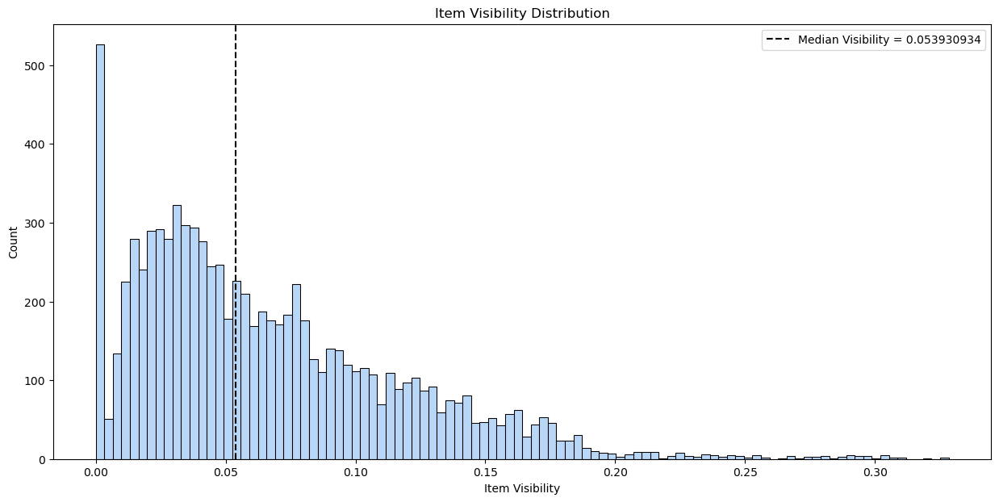

In [215]:
plt.figure(figsize = (15,7))
ax = sns.histplot(data = sales_df, x ='Item_Visibility', bins = 100);

ax.set(title = 'Item Visibility Distribution', xlabel = 'Item Visibility')

median = sales_df['Item_Visibility'].median()

ax.axvline(median, color = 'black', ls = '--',
           label = f'Median Visibility = {median}')

ax.legend();


* Item_Visibility distribution is also right skewed
* Most have zero visibility

In [216]:
sales_df['Item_Visibility'].describe()

count   8,523.0000
mean        0.0661
std         0.0516
min         0.0000
25%         0.0270
50%         0.0539
75%         0.0946
max         0.3284
Name: Item_Visibility, dtype: float64

**Item Weight Distribution**

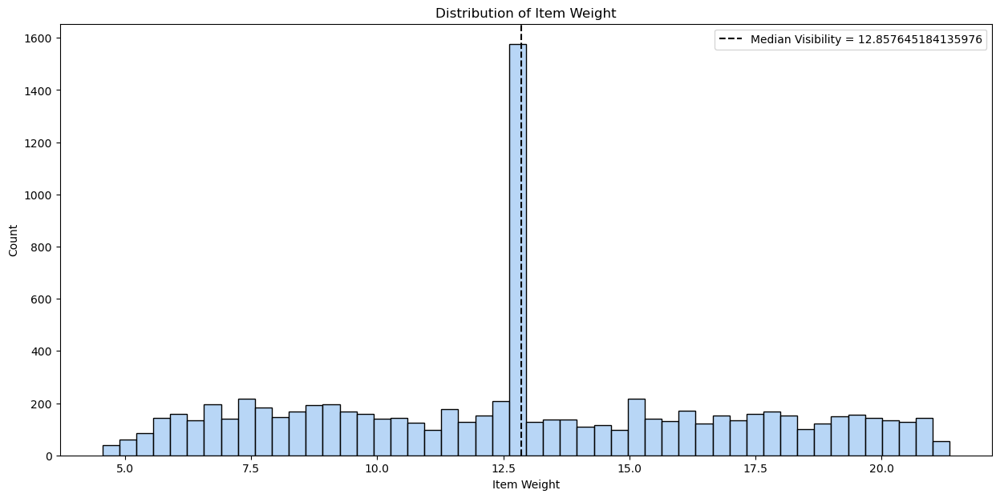

In [217]:

plt.figure(figsize = (15,7))
ax = sns.histplot(data = sales_df, x ='Item_Weight', bins = 50);

ax.set(title = 'Distribution of Item Weight', xlabel = 'Item Weight')

median = sales_df['Item_Weight'].median()

ax.axvline(median, color = 'black', ls = '--',
           label = f'Median Visibility = {median}')

ax.legend();


* Largest amount of items fall around the median weight due to filling in missing values

**Item Sales Boxplot Visualization**

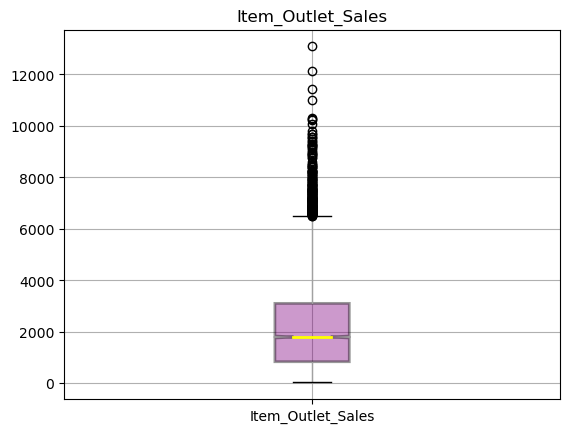

In [218]:
sales_df.boxplot(column = ['Item_Outlet_Sales'], 
           notch = True, patch_artist = True, 
           medianprops = dict(linestyle='-', linewidth=2, color='Yellow'),
           boxprops = dict(linestyle='--', linewidth=2, color='Black', facecolor = 'purple', alpha = .4));
           
plt.title('Item_Outlet_Sales');


* There are many sales outliers present above maximum 

**Item Visibility Boxplot Visualization**



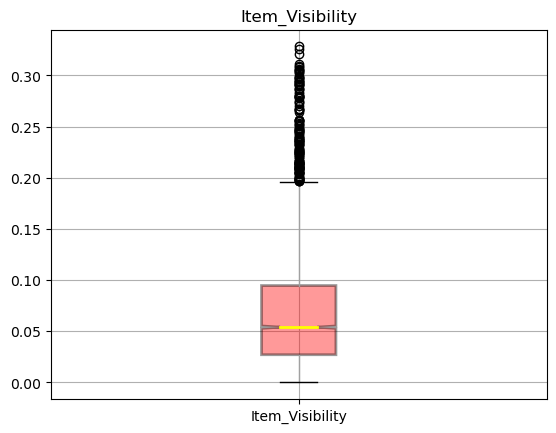

In [219]:
sales_df.boxplot(column = ['Item_Visibility'], 
           notch = True, patch_artist = True, 
           medianprops = dict(linestyle='-', linewidth=2, color='Yellow'),
           boxprops = dict(linestyle='--', linewidth=2, color='Black', facecolor = 'red', alpha = .4));
           
plt.title('Item_Visibility');


* Many visibility outliers present above maxiumum

**Item Weight Boxplot Distribution**

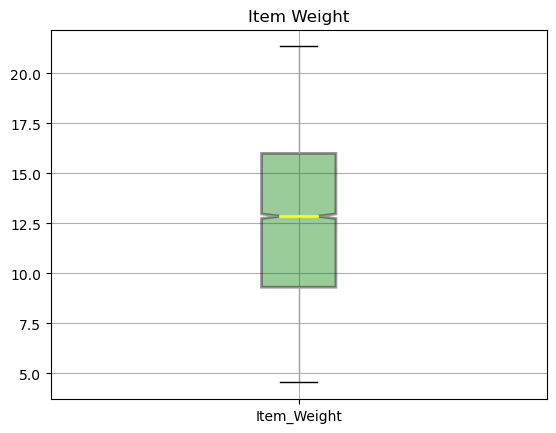

In [220]:
sales_df.boxplot(column = ['Item_Weight'], 
           notch = True, patch_artist = True, 
           medianprops = dict(linestyle='-', linewidth=2, color='Yellow'),
           boxprops = dict(linestyle='--', linewidth=2, color='Black', facecolor = 'green', alpha = .4));
           
plt.title('Item Weight');


* No outliers present for item weight

In [221]:
sales_df['Item_Weight'].describe()

count   8,523.0000
mean       12.8576
std         4.2261
min         4.5550
25%         9.3100
50%        12.8576
75%        16.0000
max        21.3500
Name: Item_Weight, dtype: float64

**Correlation of Data using Heatmap**

/var/folders/fp/jpcv35096h9d0ylkqvbwx2xm0000gn/T/ipykernel_9482/3413413323.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = sales_df.corr()


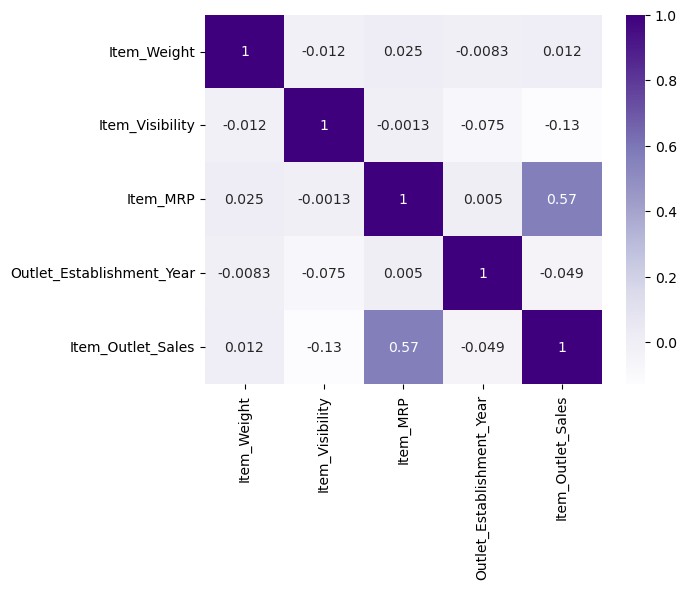

In [222]:
corr = sales_df.corr()
sns.heatmap(corr, cmap = 'Purples', annot= True);

# From Learn Platform 

* There is a moderate correlation between Item_MRP and Item_Outlet Sales
* This is to be expected as item price correlates to total sales
* There are no other significant correlations present in the dataset

**Fat Content Visualization**

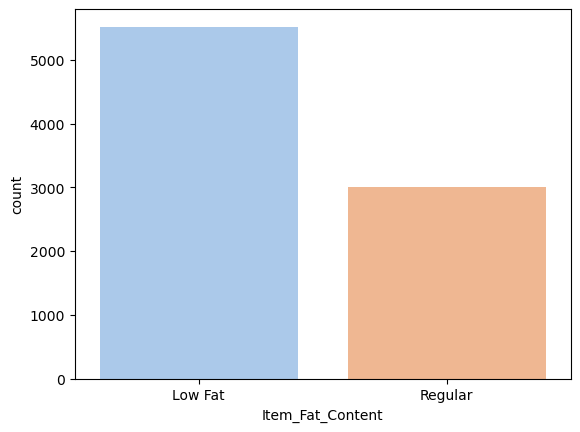

In [223]:
sns.countplot(data=sales_df, x='Item_Fat_Content');

*More low fat items than regular in data set

**Fat Content and Outlet Sales Visualization**

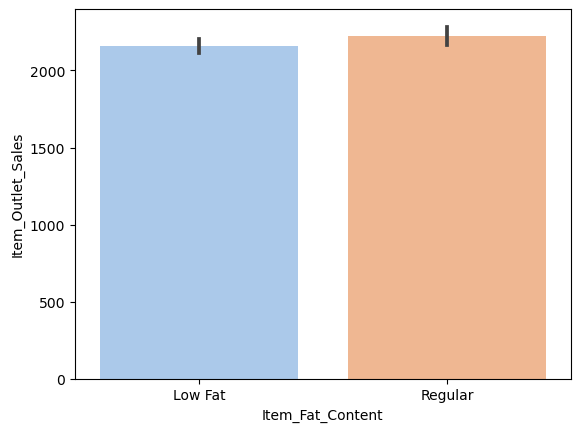

In [224]:
sns.barplot(data=sales_df, x='Item_Fat_Content', y='Item_Outlet_Sales');

 * More regular items are sold but the sales are close





**Compare Item_Type to Outlet_Sales**

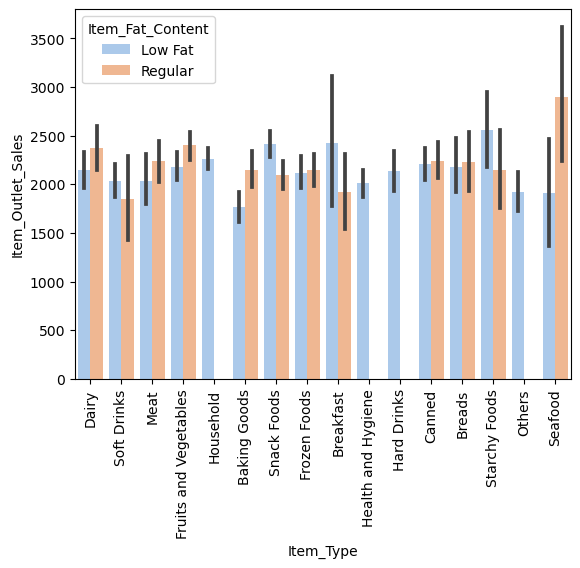

In [225]:
sns.barplot(data=sales_df, x='Item_Type', y='Item_Outlet_Sales', hue ='Item_Fat_Content');
plt.xticks(rotation='vertical');

* Shows how each item is selling
* Regular seafood selling more than low fat seafood
* Low fat starchy foods are selling more than regular fat
* Low fat breakfast foods are selling more than regular fat
* Low fat snack foods are selling more than regular fat
* Regular fat baking goods are selling more than low fat
* Regular fat dairy is selling more than low fat dairy

**Comparing Item_Type to Item_MRP**

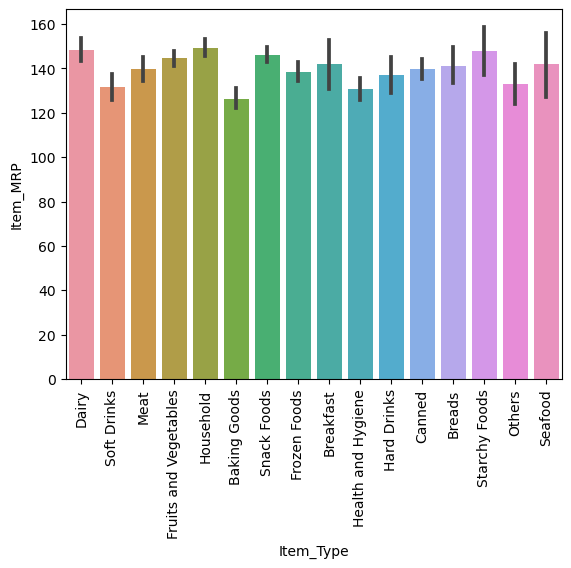

In [226]:
sns.barplot(data=sales_df, x='Item_Type', y='Item_MRP');
plt.xticks(rotation='vertical');

* Item type and its sales price
* Highest priced items are dairy, household goods, starchy foods
* Lowest priced are baking goods

** Comparing Outlet_Size to Item_Outlet_Sales

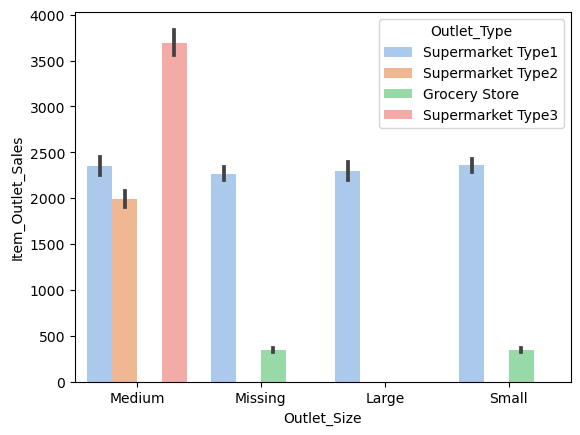

In [227]:
sns.barplot(data=sales_df, x='Outlet_Size', y='Item_Outlet_Sales', hue='Outlet_Type');


* Pending data marked as missing, medium sized stores have the highest sales
* Supermarket type 3 has the highest sales in the medium category
* Large size only has Supermarket type 1's
* Supermarket type 1 has the highest sales in the small size category

**Outlet_Size Comparison**

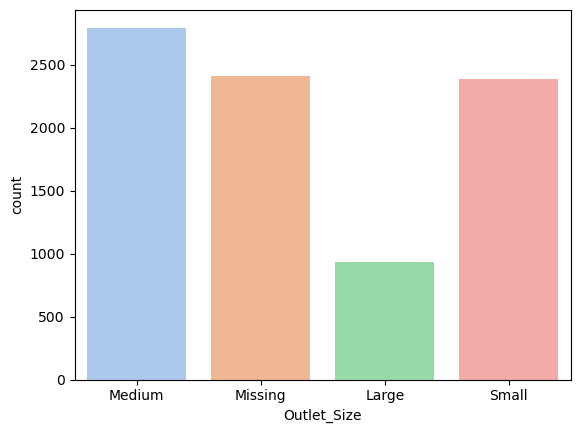

In [228]:
sns.countplot(data=sales_df, x='Outlet_Size');

* Pending data marked missing, medium outlet stores are the most popular size
followed by small 

## Explanatory Visuals

In [229]:
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                8523 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                8523 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


## What are the highest and lowest selling items? 

In [230]:
# What foods sell the least/most
means = sales_df.groupby('Item_Type')['Item_Outlet_Sales'].mean().sort_values(ascending = False)
means

Item_Type
Starchy Foods           2,374.3328
Seafood                 2,326.0659
Fruits and Vegetables   2,289.0096
Snack Foods             2,277.3217
Household               2,258.7843
Dairy                   2,232.5426
Canned                  2,225.1949
Breads                  2,204.1322
Meat                    2,158.9779
Hard Drinks             2,139.2216
Frozen Foods            2,132.8677
Breakfast               2,111.8087
Health and Hygiene      2,010.0003
Soft Drinks             2,006.5117
Baking Goods            1,952.9712
Others                  1,926.1397
Name: Item_Outlet_Sales, dtype: float64

/var/folders/fp/jpcv35096h9d0ylkqvbwx2xm0000gn/T/ipykernel_9482/2244671982.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(data=sales_df,x='Item_Type', y = 'Item_Outlet_Sales', order = means.index,
/var/folders/fp/jpcv35096h9d0ylkqvbwx2xm0000gn/T/ipykernel_9482/2244671982.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(new_labels);


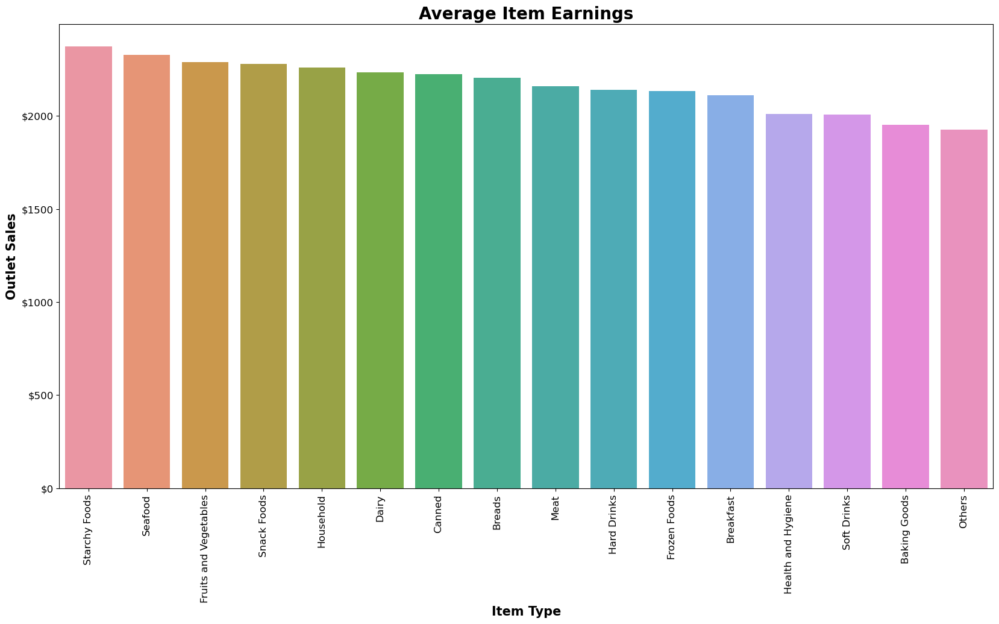

In [231]:

fig, ax = plt.subplots(figsize=(20,10))

ax = sns.barplot(data=sales_df,x='Item_Type', y = 'Item_Outlet_Sales', order = means.index,
                 ci = None);


plt.xticks(rotation = 'vertical', fontsize = 12)
plt.yticks(fontsize = 12);
ax.set_title('Average Item Earnings', fontsize = 20, fontweight = 'bold');
ax.set_xlabel('Item Type', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('Outlet Sales', fontsize = 15, fontweight = 'bold');


ticks = ax.get_yticks();
new_labels = ['${}'.format(int(amt)) for amt in ticks];
ax.set_yticklabels(new_labels);



# Help from Exemplar student project
#https://keithwithdata.medium.com/this-week-i-learnt-how-to-add-to-ticks-on-matplotlib-graphs-f67ccee1f3dc

The highest selling items are starchy foods and the lowest is the Others category.

**Recommendation:** Focusing on more diversity in higher selling categories or better product placement/marketing of lower selling items to increase sales. 

## Which outlet type has the highest sales? 

In [232]:
means_2 = sales_df.groupby('Outlet_Type')['Item_Outlet_Sales'].mean().sort_values(ascending = False)
means_2

Outlet_Type
Supermarket Type3   3,694.0386
Supermarket Type1   2,316.1811
Supermarket Type2   1,995.4987
Grocery Store         339.8285
Name: Item_Outlet_Sales, dtype: float64

/var/folders/fp/jpcv35096h9d0ylkqvbwx2xm0000gn/T/ipykernel_9482/571955316.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(data=sales_df,x='Outlet_Type', y = 'Item_Outlet_Sales' , order = means_2.index,
/var/folders/fp/jpcv35096h9d0ylkqvbwx2xm0000gn/T/ipykernel_9482/571955316.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(new_labels);


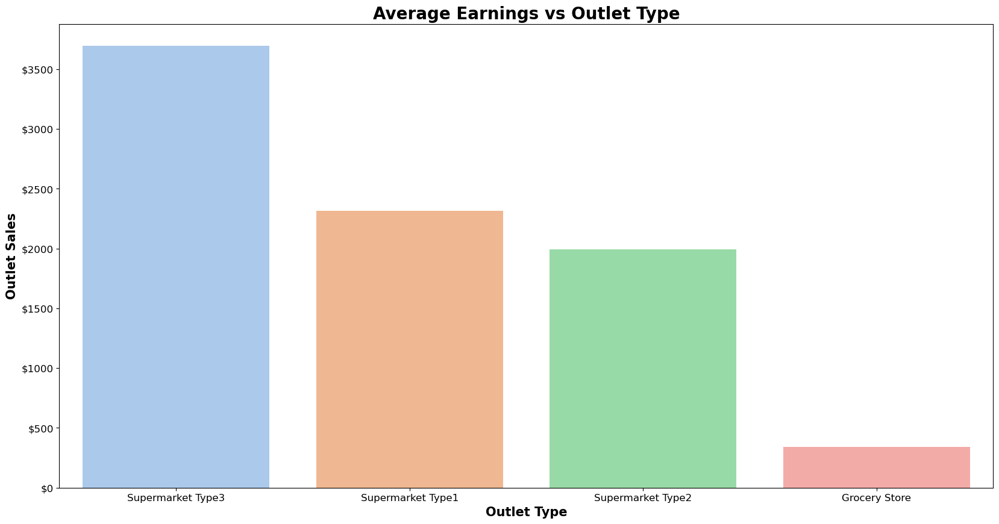

In [233]:
fig, ax = plt.subplots(figsize=(20,10))

ax = sns.barplot(data=sales_df,x='Outlet_Type', y = 'Item_Outlet_Sales' , order = means_2.index, 
                 ci = None)


ax.set_title('Average Earnings vs Outlet Type', fontsize = 20, fontweight = 'bold');
ax.set_xlabel('Outlet Type', fontsize = 15, fontweight = 'bold');
ax.set_ylabel('Outlet Sales', fontsize = 15, fontweight = 'bold');

plt.xticks(fontsize = 12);
plt.yticks(fontsize = 12);

ticks = ax.get_yticks();
new_labels = ['${}'.format(int(amt)) for amt in ticks];
ax.set_yticklabels(new_labels);

Supermarket Type 3 have the highest sales while Grocery Stores have the lowest sales. 

**Recommendation:** Focus on acquiring more Type 3 Supermarkets for product placement as they sell better. 

## Which outlet type has the most stores?

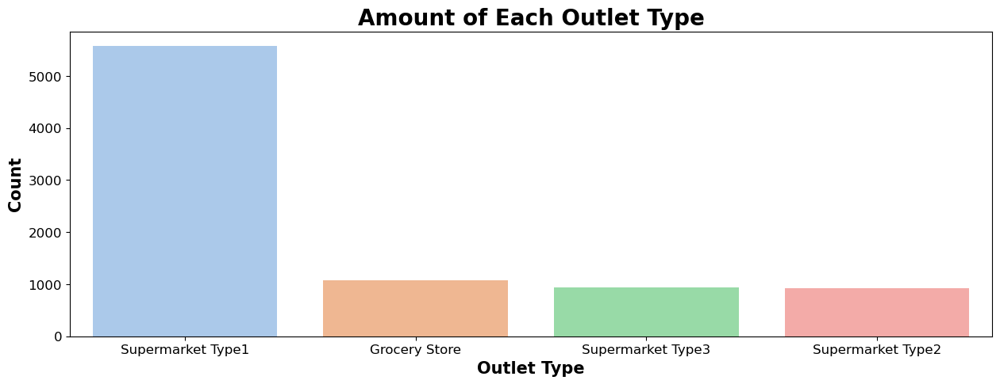

In [234]:
fig, ax = plt.subplots(figsize=(15,5))

ax = sns.countplot(data=sales_df, x='Outlet_Type', order = sales_df['Outlet_Type'].value_counts(ascending = False).index);


ax.set_title('Amount of Each Outlet Type', fontsize = 20, fontweight = 'bold');
ax.set_xlabel('Outlet Type', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('Count', fontsize = 15, fontweight = 'bold');

plt.xticks(fontsize = 12);
plt.yticks(fontsize = 12);

# https://www.statology.org/seaborn-countplot-order/

There are more of Type 1 Supermarkets and Grocery Stores, yet Type 3 has significantly higher earnings. 

**Recommendation:** Look further into Type 3 Supermarkets and how they are acheiving higher sales including sales strategies, location, product placement, etc. These properties may be applied to other outlets, like Type 1 Supermarkets or business can be pivoted towards Type 3 Supermarkets.

## What items/characteristics are popular in Supermarket Type 3 stores? 

In [235]:
outlet_filter = sales_df['Outlet_Type'] == 'Supermarket Type3'
outlet_filter

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7        True
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18       True
19      False
20      False
21       True
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36       True
37      False
38       True
39       True
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62       True
63      False
64       True
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [236]:
means3 = sales_df.loc[outlet_filter,:].groupby('Item_Type')['Item_Outlet_Sales'].mean().sort_values(ascending = False)
means3

Item_Type
Breakfast               4,584.7593
Fruits and Vegetables   4,114.4871
Dairy                   3,915.1822
Meat                    3,862.2939
Household               3,821.2078
Canned                  3,779.8668
Snack Foods             3,745.1687
Breads                  3,565.1227
Frozen Foods            3,553.6215
Starchy Foods           3,512.1901
Hard Drinks             3,432.9516
Health and Hygiene      3,318.0698
Soft Drinks             3,284.9388
Baking Goods            3,248.8724
Others                  2,700.9287
Seafood                 2,687.0737
Name: Item_Outlet_Sales, dtype: float64

/var/folders/fp/jpcv35096h9d0ylkqvbwx2xm0000gn/T/ipykernel_9482/539940541.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(data=sales_df.loc[outlet_filter,:],x='Item_Type', y = 'Item_Outlet_Sales', order = means3.index,
/var/folders/fp/jpcv35096h9d0ylkqvbwx2xm0000gn/T/ipykernel_9482/539940541.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(new_labels);


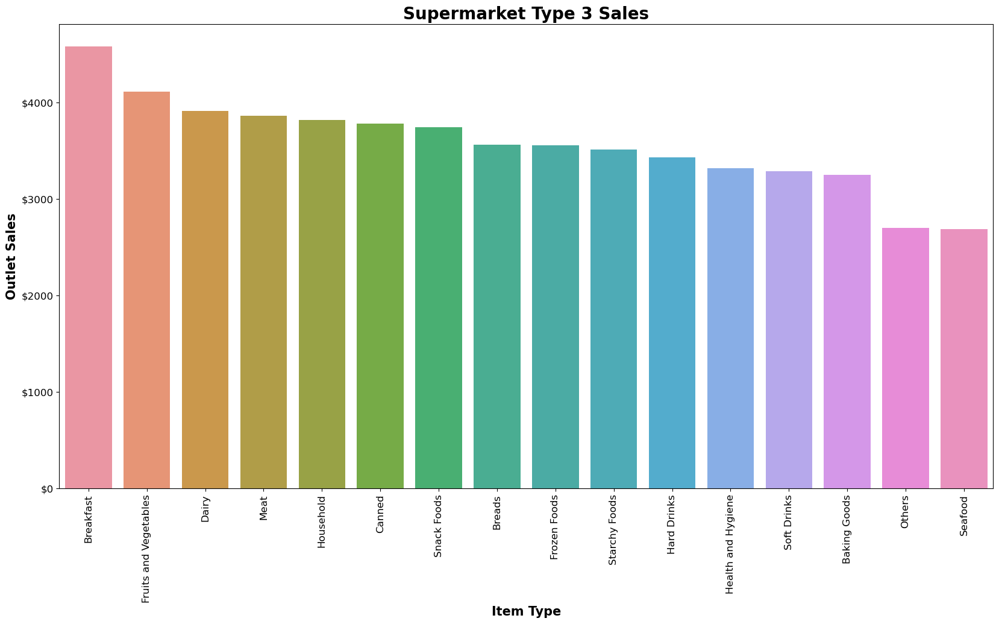

In [237]:
fig, ax = plt.subplots(figsize=(20,10))

ax = sns.barplot(data=sales_df.loc[outlet_filter,:],x='Item_Type', y = 'Item_Outlet_Sales', order = means3.index,
                 ci = None);


plt.xticks(rotation = 'vertical', fontsize = 12)
plt.yticks(fontsize = 12)

ax.set_title('Supermarket Type 3 Sales', fontsize = 20, fontweight = 'bold');
ax.set_xlabel('Item Type', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('Outlet Sales', fontsize = 15, fontweight = 'bold');


ticks = ax.get_yticks();
new_labels = ['${}'.format(int(amt)) for amt in ticks];
ax.set_yticklabels(new_labels);

Breakfast foods are the highest earners, followed by Fruits and Vegetables. The lowest earning products are Seafood and the Others category. 

Effects of fat content on sales can be found below. 

/var/folders/fp/jpcv35096h9d0ylkqvbwx2xm0000gn/T/ipykernel_9482/153789227.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(data = sales_df.loc[outlet_filter, :], x = 'Item_Type', y = 'Item_Outlet_Sales', hue = 'Item_Fat_Content',
/var/folders/fp/jpcv35096h9d0ylkqvbwx2xm0000gn/T/ipykernel_9482/153789227.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(new_labels);


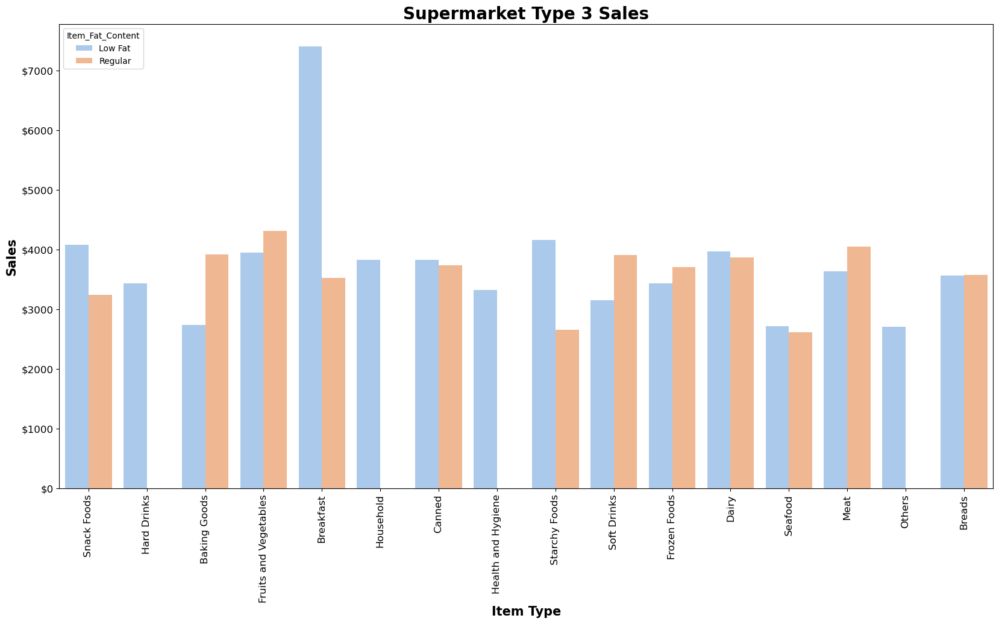

In [238]:
fig, ax = plt.subplots(figsize=(20,10))
ax = sns.barplot(data = sales_df.loc[outlet_filter, :], x = 'Item_Type', y = 'Item_Outlet_Sales', hue = 'Item_Fat_Content',
                 ci = None)

plt.xticks(rotation = 'vertical', fontsize = 12)
plt.yticks(fontsize = 12)

ax.set_title('Supermarket Type 3 Sales', fontsize = 20, fontweight = 'bold');
ax.set_xlabel('Item Type', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('Sales', fontsize = 15, fontweight = 'bold');


ticks = ax.get_yticks();
new_labels = ['${}'.format(int(amt)) for amt in ticks];
ax.set_yticklabels(new_labels);



The highest sold items are low fat breakfast products. 
The lowest sold is regular seafood. 

Major differences in sales include Low fat starchy foods and snack foods outselling regular fat options. Meanwhile, Regular fat options for baking goods and fruits and vegetables outsell the lower fat counterparts. 

In [239]:
outlet3_sales = sales_df.loc[outlet_filter,:].groupby(['Item_Type', 'Item_Fat_Content'])['Item_Outlet_Sales'].mean().sort_values(ascending = False)
outlet3_sales

Item_Type              Item_Fat_Content
Breakfast              Low Fat            7,405.9153
Fruits and Vegetables  Regular            4,308.8391
Starchy Foods          Low Fat            4,155.5907
Snack Foods            Low Fat            4,080.8100
Meat                   Regular            4,046.7324
Dairy                  Low Fat            3,968.5633
Fruits and Vegetables  Low Fat            3,950.8222
Baking Goods           Regular            3,912.0633
Soft Drinks            Regular            3,907.5802
Dairy                  Regular            3,866.3767
Canned                 Low Fat            3,829.3772
Household              Low Fat            3,821.2078
Canned                 Regular            3,733.0326
Frozen Foods           Regular            3,706.5419
Meat                   Low Fat            3,633.5902
Breads                 Regular            3,568.4978
                       Low Fat            3,562.3433
Breakfast              Regular            3,526.8258
Hard D

/var/folders/fp/jpcv35096h9d0ylkqvbwx2xm0000gn/T/ipykernel_9482/3138624143.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(data = sales_df.loc[outlet_filter, :], x = 'Item_Fat_Content', y = 'Item_Outlet_Sales',
/var/folders/fp/jpcv35096h9d0ylkqvbwx2xm0000gn/T/ipykernel_9482/3138624143.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(new_labels);


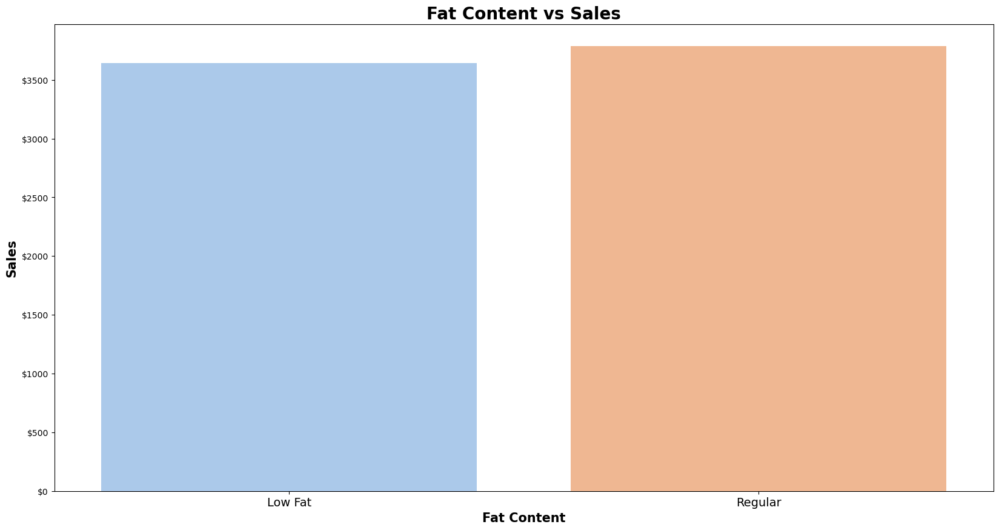

In [240]:
fig, ax = plt.subplots(figsize=(20,10))
ax = sns.barplot(data = sales_df.loc[outlet_filter, :], x = 'Item_Fat_Content', y = 'Item_Outlet_Sales',
                 ci = None)


ax.set_title('Fat Content vs Sales', fontsize = 20, fontweight = 'bold');
ax.set_xlabel('Fat Content', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('Sales', fontsize = 15, fontweight = 'bold');

plt.xticks(fontsize = 14)
ticks = ax.get_yticks();
new_labels = ['${}'.format(int(amt)) for amt in ticks];
ax.set_yticklabels(new_labels);

The sales of Regular fat products is slightly higher for Type 3 markets but Low Fat products still have strong sales. 

**Final Recommendation:** Focus can be on increasing the sales of low fat products or higher overall selling products. Focus can alternatively be on finding out why the low earning products aren't as profitable in a Type 3 market.  

# Preprocessing for Machine Learning

## Import and Load Data

* Reloading Data to return to original dataset and prevent data leakage.
* Imputations will be done following split. 
* Preprocessing for Machine Learning
* Linear Regression
* Simple Decision Tree

In [241]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_selector
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder 
from sklearn.compose import make_column_transformer
from sklearn.impute import SimpleImputer
from sklearn import set_config
set_config(display='diagram')
import joblib
pd.set_option('display.max_columns', 50)

## setting random state for reproducibility
SEED = 321
np.random.seed(SEED)


filename = ('Data/sales_predictions - sales_predictions.csv')
df = pd.read_csv(filename)

## Data Cleaning

**Explore Data**

In [242]:
df.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.3000,Low Fat,0.0160,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,"3,735.1380"
1,DRC01,5.9200,Regular,0.0193,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.5000,Low Fat,0.0168,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,"2,097.2700"
3,FDX07,19.2000,Regular,0.0000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.9300,Low Fat,0.0000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [243]:
df.tail()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
8518,FDF22,6.8650,Low Fat,0.0568,Snack Foods,214.5218,OUT013,1987,High,Tier 3,Supermarket Type1,"2,778.3834"
8519,FDS36,8.3800,Regular,0.0470,Baking Goods,108.1570,OUT045,2002,NaN,Tier 2,Supermarket Type1,549.2850
8520,NCJ29,10.6000,Low Fat,0.0352,Health and Hygiene,85.1224,OUT035,2004,Small,Tier 2,Supermarket Type1,"1,193.1136"
8521,FDN46,7.2100,Regular,0.1452,Snack Foods,103.1332,OUT018,2009,Medium,Tier 3,Supermarket Type2,"1,845.5976"
8522,DRG01,14.8000,Low Fat,0.0449,Soft Drinks,75.4670,OUT046,1997,Small,Tier 1,Supermarket Type1,765.6700


In [244]:
df.dtypes

Item_Identifier               object
Item_Weight                  float64
Item_Fat_Content              object
Item_Visibility              float64
Item_Type                     object
Item_MRP                     float64
Outlet_Identifier             object
Outlet_Establishment_Year      int64
Outlet_Size                   object
Outlet_Location_Type          object
Outlet_Type                   object
Item_Outlet_Sales            float64
dtype: object

In [245]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


In [246]:
df.nunique()

Item_Identifier              1559
Item_Weight                   415
Item_Fat_Content                5
Item_Visibility              7880
Item_Type                      16
Item_MRP                     5938
Outlet_Identifier              10
Outlet_Establishment_Year       9
Outlet_Size                     3
Outlet_Location_Type            3
Outlet_Type                     4
Item_Outlet_Sales            3493
dtype: int64

**Duplicates**

In [247]:
# None present
df.duplicated().sum()

0

In [248]:
# Dropping column
df = df.drop('Item_Identifier', axis = 'columns')

df.head()

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,9.3000,Low Fat,0.0160,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,"3,735.1380"
1,5.9200,Regular,0.0193,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,17.5000,Low Fat,0.0168,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,"2,097.2700"
3,19.2000,Regular,0.0000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,8.9300,Low Fat,0.0000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


**Inspecting Categorical Columns and Addressing Inconsistencies**

In [249]:
dtypes = df.dtypes
str_cols = dtypes[dtypes=='object'].index
str_cols

Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Size',
       'Outlet_Location_Type', 'Outlet_Type'],
      dtype='object')

In [250]:
for col in str_cols:
    print(f"- Column= {col}")
    print(df[col].value_counts(dropna=False))
    print('\n\n')

- Column= Item_Fat_Content
Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64



- Column= Item_Type
Fruits and Vegetables    1232
Snack Foods              1200
Household                 910
Frozen Foods              856
Dairy                     682
Canned                    649
Baking Goods              648
Health and Hygiene        520
Soft Drinks               445
Meat                      425
Breads                    251
Hard Drinks               214
Others                    169
Starchy Foods             148
Breakfast                 110
Seafood                    64
Name: Item_Type, dtype: int64



- Column= Outlet_Identifier
OUT027    935
OUT013    932
OUT049    930
OUT046    930
OUT035    930
OUT045    929
OUT018    928
OUT017    926
OUT010    555
OUT019    528
Name: Outlet_Identifier, dtype: int64



- Column= Outlet_Size
Medium    2793
NaN       2410
Small     2388
High       932
Name: Outlet_Size, dtype: int

In [251]:
df['Item_Fat_Content'].value_counts()

Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64

In [252]:
# Renaming for Consistency in Categorical Values
fat_content_map = {'LF': 'Low Fat',
                   'low fat': 'Low Fat',
                   'reg': 'Regular',
                   'Low Fat': 'Low Fat',
                   'Regular': 'Regular'}

df['Item_Fat_Content'] = df['Item_Fat_Content'].replace (fat_content_map)
df['Item_Fat_Content'].value_counts()

Low Fat    5517
Regular    3006
Name: Item_Fat_Content, dtype: int64

In [253]:
#Change High to Large
df['Outlet_Size'] = df['Outlet_Size'].replace('High', 'Large')
df['Outlet_Size'].value_counts()

Medium    2793
Small     2388
Large      932
Name: Outlet_Size, dtype: int64

**Exploring/Examining Missing Data**

In [254]:
df.isna().sum()

Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

In [255]:
df[df.isna().any(axis = 1)]

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
3,19.2000,Regular,0.0000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
7,NaN,Low Fat,0.1275,Snack Foods,107.7622,OUT027,1985,Medium,Tier 3,Supermarket Type3,"4,022.7636"
8,16.2000,Regular,0.0167,Frozen Foods,96.9726,OUT045,2002,NaN,Tier 2,Supermarket Type1,"1,076.5986"
9,19.2000,Regular,0.0944,Frozen Foods,187.8214,OUT017,2007,NaN,Tier 2,Supermarket Type1,"4,710.5350"
18,NaN,Low Fat,0.0342,Hard Drinks,113.2834,OUT027,1985,Medium,Tier 3,Supermarket Type3,"2,303.6680"
21,NaN,Regular,0.0354,Baking Goods,144.5444,OUT027,1985,Medium,Tier 3,Supermarket Type3,"4,064.0432"
23,NaN,Low Fat,0.0576,Baking Goods,107.6938,OUT019,1985,Small,Tier 1,Grocery Store,214.3876
25,13.0000,Low Fat,0.0999,Household,45.9060,OUT017,2007,NaN,Tier 2,Supermarket Type1,838.9080
28,5.9250,Regular,0.1615,Dairy,45.5086,OUT010,1998,NaN,Tier 3,Grocery Store,178.4344
29,NaN,Regular,0.0722,Canned,43.6454,OUT019,1985,Small,Tier 1,Grocery Store,125.8362


Identify Column Features



In [256]:
"""
Item_Weight:                numerical   float64
Item_Fat_Content:           ordinal     object   ** Can replace before split 
Item_Visibility:            numerical   float64
Item_Type:                  nominal     object
Item_MRP:                   numerical   float64
Outlet_Identifier:          nominal     object
Outlet_Establishment_Year:  numerical   int64
Outlet_Size:                ordinal **  object   ** many missing values
Outlet_Location_Type:       nominal     object   ** do not have enough information about each tier to determine ordinal
Outlet_Type:                nominal     object
Item_Outlet_Sales:          numerical   float 64

"""

'\nItem_Weight:                numerical   float64\nItem_Fat_Content:           ordinal     object   ** Can replace before split \nItem_Visibility:            numerical   float64\nItem_Type:                  nominal     object\nItem_MRP:                   numerical   float64\nOutlet_Identifier:          nominal     object\nOutlet_Establishment_Year:  numerical   int64\nOutlet_Size:                ordinal **  object   ** many missing values\nOutlet_Location_Type:       nominal     object   ** do not have enough information about each tier to determine ordinal\nOutlet_Type:                nominal     object\nItem_Outlet_Sales:          numerical   float 64\n\n'

**Ordinal Column**

In [257]:
df['Item_Fat_Content'].value_counts()

Low Fat    5517
Regular    3006
Name: Item_Fat_Content, dtype: int64

In [258]:
replacement_dictionary = {'Low Fat':0, 'Regular':1}
df['Item_Fat_Content'].replace(replacement_dictionary, inplace=True)
df['Item_Fat_Content']

0       0
1       1
2       0
3       1
4       0
5       1
6       1
7       0
8       1
9       1
10      0
11      1
12      1
13      1
14      0
15      1
16      0
17      1
18      0
19      0
20      1
21      1
22      0
23      0
24      1
25      0
26      1
27      0
28      1
29      1
30      0
31      0
32      0
33      0
34      0
35      0
36      1
37      1
38      1
39      0
40      0
41      0
42      0
43      0
44      1
45      0
46      0
47      0
48      1
49      1
50      0
51      0
52      1
53      0
54      0
55      0
56      0
57      0
58      0
59      0
60      0
61      1
62      0
63      1
64      0
65      0
66      0
67      1
68      0
69      0
70      1
71      1
72      0
73      0
74      0
75      1
76      0
77      0
78      0
79      0
80      0
81      1
82      0
83      0
84      1
85      1
86      0
87      1
88      1
89      0
90      0
91      0
92      0
93      0
94      0
95      0
96      0
97      1
98      0
99      1


## Split Data

In [259]:
X = df.drop(columns=['Item_Outlet_Sales']).copy()
            
y = df['Item_Outlet_Sales'].copy()

In [260]:
# Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = SEED)
X_train.head()

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
8269,7.2200,1,0.0641,Baking Goods,61.2510,OUT010,1998,NaN,Tier 3,Grocery Store
7604,6.1350,0,0.0793,Soft Drinks,111.2860,OUT018,2009,Medium,Tier 3,Supermarket Type2
2762,12.1500,0,0.0286,Household,151.0708,OUT035,2004,Small,Tier 2,Supermarket Type1
6464,5.9450,0,0.0930,Household,127.8652,OUT035,2004,Small,Tier 2,Supermarket Type1
4707,18.2000,1,0.0663,Fruits and Vegetables,247.2092,OUT035,2004,Small,Tier 2,Supermarket Type1


## Instantiate Column Selectors

In [261]:
cat_cols = ['Item_Type','Outlet_Identifier', 'Outlet_Location_Type', 'Outlet_Type']

ord_cols = ['Outlet_Size'] 

num_selector = make_column_selector(dtype_include = 'number')


## Instantiate Transformers

In [262]:
# Imputers

freq_imputer = SimpleImputer(strategy = 'most_frequent')

mean_imputer = SimpleImputer(strategy = 'mean')
 

# Scaler

scaler = StandardScaler()


# One Hot Encoder

ohe = OneHotEncoder(handle_unknown = 'ignore', sparse =False)


# Ordinal Encoder
 

ord_cat = [['Small', 'Medium', 'Large']]

oe = OrdinalEncoder(categories= ord_cat)


## Instantiate Pipelines 

In [263]:
# Numeric pipeline  

numeric_pipeline = make_pipeline(mean_imputer, scaler)

numeric_pipeline

Pipeline(steps=[('simpleimputer', SimpleImputer()),
                ('standardscaler', StandardScaler())])

In [264]:
# Categorical Pipeline

categorical_pipeline = make_pipeline(freq_imputer, ohe)

categorical_pipeline

Pipeline(steps=[('simpleimputer', SimpleImputer(strategy='most_frequent')),
                ('onehotencoder',
                 OneHotEncoder(handle_unknown='ignore', sparse=False))])

In [265]:
# Ordinal Pipeline

ordinal_pipeline = make_pipeline(freq_imputer, oe, scaler)

ordinal_pipeline

Pipeline(steps=[('simpleimputer', SimpleImputer(strategy='most_frequent')),
                ('ordinalencoder',
                 OrdinalEncoder(categories=[['Small', 'Medium', 'Large']])),
                ('standardscaler', StandardScaler())])

## Instantiate Transformers

In [266]:
# Making tuples for transformer

num_tuple = (numeric_pipeline, num_selector)

cat_tuple = (categorical_pipeline, cat_cols)

ord_tuple = (ordinal_pipeline, ord_cols)

# Column Transformer

preprocessor = make_column_transformer(num_tuple, cat_tuple, ord_tuple, 
                                       verbose_feature_names_out = False) 
preprocessor

ColumnTransformer(transformers=[('pipeline-1',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer()),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x128552280>),
                                ('pipeline-2',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False))]),
                                 ['Item_Type', 'Outlet_Identifier',
                                  'Outlet_Location_Type', 'Outlet_Type']),
                                ('pipeline-3',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Small',
                                                                              'Medium',
                                                                              'Large']])),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 ['Outlet_Size'])],
                  verbose_feature_names_out=False)

## Transform Data

In [267]:
# Fit only on train
preprocessor.fit(X_train)
feature_names = preprocessor.get_feature_names_out()
feature_names

array(['Item_Weight', 'Item_Fat_Content', 'Item_Visibility', 'Item_MRP',
       'Outlet_Establishment_Year', 'Item_Type_Baking Goods',
       'Item_Type_Breads', 'Item_Type_Breakfast', 'Item_Type_Canned',
       'Item_Type_Dairy', 'Item_Type_Frozen Foods',
       'Item_Type_Fruits and Vegetables', 'Item_Type_Hard Drinks',
       'Item_Type_Health and Hygiene', 'Item_Type_Household',
       'Item_Type_Meat', 'Item_Type_Others', 'Item_Type_Seafood',
       'Item_Type_Snack Foods', 'Item_Type_Soft Drinks',
       'Item_Type_Starchy Foods', 'Outlet_Identifier_OUT010',
       'Outlet_Identifier_OUT013', 'Outlet_Identifier_OUT017',
       'Outlet_Identifier_OUT018', 'Outlet_Identifier_OUT019',
       'Outlet_Identifier_OUT027', 'Outlet_Identifier_OUT035',
       'Outlet_Identifier_OUT045', 'Outlet_Identifier_OUT046',
       'Outlet_Identifier_OUT049', 'Outlet_Location_Type_Tier 1',
       'Outlet_Location_Type_Tier 2', 'Outlet_Location_Type_Tier 3',
       'Outlet_Type_Grocery Store', 'Outle

In [268]:
X_train_df = pd.DataFrame(preprocessor.transform(X_train),
                         columns = feature_names, index = X_train.index)
X_train_df.head(3)

X_test_df = pd.DataFrame(preprocessor.transform(X_test),
                        columns = feature_names, index = X_test.index)
X_test_df.head(3)

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Type_Baking Goods,Item_Type_Breads,Item_Type_Breakfast,Item_Type_Canned,Item_Type_Dairy,Item_Type_Frozen Foods,Item_Type_Fruits and Vegetables,Item_Type_Hard Drinks,Item_Type_Health and Hygiene,Item_Type_Household,Item_Type_Meat,Item_Type_Others,Item_Type_Seafood,Item_Type_Snack Foods,Item_Type_Soft Drinks,Item_Type_Starchy Foods,Outlet_Identifier_OUT010,Outlet_Identifier_OUT013,Outlet_Identifier_OUT017,Outlet_Identifier_OUT018,Outlet_Identifier_OUT019,Outlet_Identifier_OUT027,Outlet_Identifier_OUT035,Outlet_Identifier_OUT045,Outlet_Identifier_OUT046,Outlet_Identifier_OUT049,Outlet_Location_Type_Tier 1,Outlet_Location_Type_Tier 2,Outlet_Location_Type_Tier 3,Outlet_Type_Grocery Store,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3,Outlet_Size
8077,0.5715,-0.7332,-0.0935,-0.1206,1.0996,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.2870
2391,1.1836,-0.7332,-0.4217,-0.2045,-0.0933,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,-1.3762
163,-1.3073,-0.7332,0.0901,-0.4121,-0.0933,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,-1.3762


In [269]:
# Confirm the first 3 rows index in y_test match X_test_df
y_test.head(3)

8077   1,696.4584
2391   2,024.0320
163    2,618.5914
Name: Item_Outlet_Sales, dtype: float64

## Linear Regression Model

**Functions**

In [270]:
def evaluate_regression(model, X_train,y_train, X_test, y_test): 
    """Evaluates a scikit learn regression model using r-squared and RMSE"""
    
    ## Training Data
    y_pred_train = model.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_pred_train)
    rmse_train = metrics.mean_squared_error(y_train, y_pred_train, 
                                            squared=False)
    
    print(f"Training Data:\tR^2= {r2_train:.2f}\tRMSE= {rmse_train:.2f}")
        
    
    ## Test Data
    y_pred_test = model.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_pred_test)
    rmse_test = metrics.mean_squared_error(y_test, y_pred_test, 
                                            squared=False)
    
    print(f"Test Data:\tR^2= {r2_test:.2f}\tRMSE= {rmse_test:.2f}")

In [271]:
def plot_coeffs(coeffs, top_n=None, figsize=(4,5), 
                intercept=False, intercept_name="intercept", 
                annotate=False, ha='left', va='center', size=12, 
                xytext=(4,0), textcoords='offset points'):
    """ Plots the top_n coefficients from a Series, with optional annotations.
    """
    # Drop intercept if intercept=False and 
    if (intercept == False) & (intercept_name in coeffs.index):
        coeffs = coeffs.drop(intercept_name)
    if top_n == None:
        ## sort all features and set title
        plot_vals = coeffs.sort_values()
        title = "All Coefficients - Ranked by Magnitude"
    else:
        ## rank the coeffs and select the top_n
        coeff_rank = coeffs.abs().rank().sort_values(ascending=False)
        top_n_features = coeff_rank.head(top_n)
        
        ## sort features and keep top_n and set title
        plot_vals = coeffs.loc[top_n_features.index].sort_values()
        title = f"Top {top_n} Largest Coefficients"
    ## plotting top N importances
    ax = plot_vals.plot(kind='barh', figsize=figsize)
    ax.set(xlabel='Coefficient', 
            ylabel='Feature Names', 
            title=title)
    ax.axvline(0, color='k')
    if annotate == True:
        annotate_hbars(ax, ha=ha, va=va, size=size, xytext=xytext, textcoords=textcoords)
    return ax

In [272]:
def get_importances(model, feature_names=None,name='Feature Importance',
                   sort=False, ascending=True):
    
    ## checking for feature names
    if feature_names == None:
        feature_names = model.feature_names_in_
        
    ## Saving the feature importances
    importances = pd.Series(model.feature_importances_, index= feature_names,
                           name=name)
    
    # sort importances
    if sort == True:
        importances = importances.sort_values(ascending=ascending)
        
    return importances

In [273]:
def plot_importance(importances, top_n=None,  figsize=(8,6)):
    # sorting with asc=false for correct order of bars
    if top_n==None:
        ## sort all features and set title
        plot_vals = importances.sort_values()
        title = "All Features - Ranked by Importance"
    else:
        ## sort features and keep top_n and set title
        plot_vals = importances.sort_values().tail(top_n)
        title = f"Top {top_n} Most Important Features"
    ## plotting top N importances
    ax = plot_vals.plot(kind='barh', figsize=figsize)
    ax.set(xlabel='Importance',
            ylabel='Feature Names',
            title=title)
    ## return ax in case want to continue to update/modify figure
    return ax

In [274]:
def get_coefficients(lin_reg):
    coeffs = pd.Series(lin_reg.coef_, index= lin_reg.feature_names_in_)
    coeffs.loc['intercept'] = lin_reg.intercept_
    return coeffs

**Linear Regression Metrics**

In [275]:
# Instance of model
lin_reg = LinearRegression()
lin_reg.fit(X_train_df, y_train)
evaluate_regression(lin_reg, X_train_df, y_train, X_test_df, y_test)

Training Data:	R^2= 0.56	RMSE= 1115.04
Test Data:	R^2= 0.56	RMSE= 1164.38


**Finding Coefficients**

In [276]:
## formatting numbers to not use , thousands sep, and 4 digits floats
pd.set_option('display.float_format',lambda x: f"{x:,.4f}")
pd.set_option('display.max_rows', None)

In [277]:
coeffs = get_coefficients(lin_reg)
coeffs

Item_Weight                                             4.9163
Item_Fat_Content                                       19.8297
Item_Visibility                                        -9.7056
Item_MRP                                              967.8373
Outlet_Establishment_Year         -11,545,538,250,170,050.0000
Item_Type_Baking Goods               -300,797,539,985,637.8125
Item_Type_Breads                     -300,797,539,985,647.7500
Item_Type_Breakfast                  -300,797,539,985,584.2500
Item_Type_Canned                     -300,797,539,985,634.5625
Item_Type_Dairy                      -300,797,539,985,700.7500
Item_Type_Frozen Foods               -300,797,539,985,656.5625
Item_Type_Fruits and Vegetables      -300,797,539,985,633.1250
Item_Type_Hard Drinks                -300,797,539,985,605.3125
Item_Type_Health and Hygiene         -300,797,539,985,694.0625
Item_Type_Household                  -300,797,539,985,716.0000
Item_Type_Meat                       -300,797,539,985,6

In [278]:
coeffs.sort_values()

Outlet_Establishment_Year         -11,545,538,250,170,050.0000
Outlet_Identifier_OUT013          -10,901,393,912,027,866.0000
Outlet_Identifier_OUT019           -9,964,538,124,350,440.0000
Outlet_Identifier_OUT027           -6,883,501,035,334,206.0000
Outlet_Type_Supermarket Type3      -6,650,981,075,495,815.0000
Outlet_Type_Grocery Store          -4,241,311,755,773,023.0000
Outlet_Location_Type_Tier 1        -3,795,225,556,515,915.0000
Outlet_Location_Type_Tier 3        -3,459,862,436,219,791.5000
Outlet_Identifier_OUT045             -850,501,292,508,075.0000
Outlet_Size                          -605,290,259,683,132.0000
Item_Type_Soft Drinks                -300,797,539,985,766.6875
Item_Type_Household                  -300,797,539,985,716.0000
Item_Type_Dairy                      -300,797,539,985,700.7500
Item_Type_Health and Hygiene         -300,797,539,985,694.0625
Item_Type_Meat                       -300,797,539,985,667.3750
Item_Type_Snack Foods                -300,797,539,985,6

In [279]:
# Checking for binary categorical features; None
df.select_dtypes('object').nunique()

Item_Type               16
Outlet_Identifier       10
Outlet_Size              3
Outlet_Location_Type     3
Outlet_Type              4
dtype: int64

**Visualizing Coefficients**

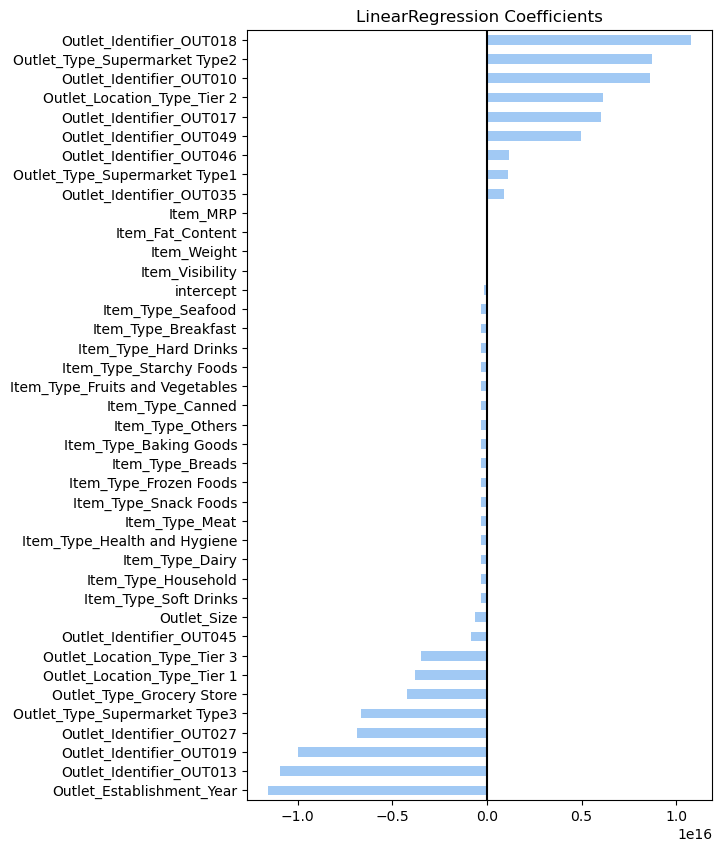

In [280]:
## Plot the coefficients
ax = coeffs.sort_values().plot(kind = 'barh', figsize = (6,10))
ax.axvline(0, color = 'k')
ax.set_title('LinearRegression Coefficients');

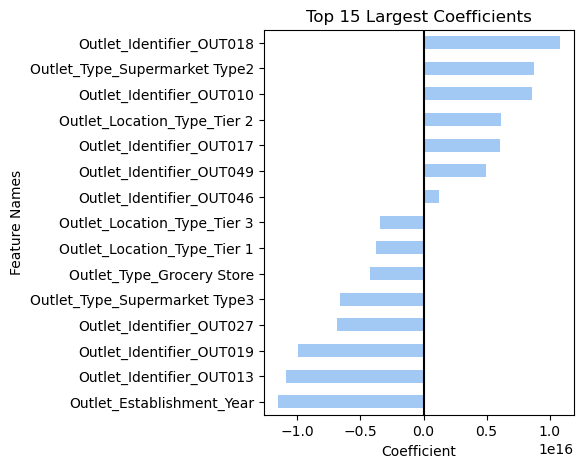

In [281]:
# Plotting top 15 largest coefficients using function
ax = plot_coeffs(coeffs, top_n = 15)

**Coefficient Interpretation**
* Going to drop outlet identifier column and establishment year column and re-run the model as these are just numerical columns without significant importance. 

In [285]:
#Train Test Split
target = "Item_Outlet_Sales"
drop_feats = ["Outlet_Establishment_Year","Outlet_Identifier"]
# X and Y 
X = df.drop(columns=[target, *drop_feats]).copy()
            
y = df[target].copy()

# Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = SEED)
X_train.head()
#Column Selectors
cat_cols = ['Item_Type', 'Outlet_Location_Type', 'Outlet_Type']
ord_cols = ['Outlet_Size'] 
num_selector = make_column_selector(dtype_include = 'number')
# Imputers
freq_imputer = SimpleImputer(strategy = 'most_frequent')
mean_imputer = SimpleImputer(strategy = 'mean')
# Scaler
scaler = StandardScaler()
# One Hot Encoder
ohe = OneHotEncoder(handle_unknown = 'ignore', sparse =False)
# Ordinal Encoder
ord_cat = [['Small', 'Medium', 'Large']]
oe = OrdinalEncoder(categories= ord_cat)
# Numeric pipeline  
numeric_pipeline = make_pipeline(mean_imputer, scaler)
numeric_pipeline
# Categorical Pipeline
categorical_pipeline = make_pipeline(freq_imputer, ohe)
categorical_pipeline
# Ordinal Pipeline
ordinal_pipeline = make_pipeline(freq_imputer, oe, scaler)
ordinal_pipeline
# Making tuples for transformer
num_tuple = (numeric_pipeline, num_selector)
cat_tuple = (categorical_pipeline, cat_cols)
ord_tuple = (ordinal_pipeline, ord_cols)
# Column Transformer
preprocessor = make_column_transformer(num_tuple, cat_tuple, ord_tuple, 
                                       verbose_feature_names_out = False) 
preprocessor

ColumnTransformer(transformers=[('pipeline-1',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer()),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x11dee78b0>),
                                ('pipeline-2',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False))]),
                                 ['Item_Type', 'Outlet_Location_Type',
                                  'Outlet_Type']),
                                ('pipeline-3',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Small',
                                                                              'Medium',
                                                                              'Large']])),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 ['Outlet_Size'])],
                  verbose_feature_names_out=False)

In [287]:
# Fit only on train
preprocessor.fit(X_train)
feature_names = preprocessor.get_feature_names_out()
feature_names
# Make dataframes
X_train_df = pd.DataFrame(preprocessor.transform(X_train),
                         columns = feature_names, index = X_train.index)
X_train_df.head(3)

X_test_df = pd.DataFrame(preprocessor.transform(X_test),
                        columns = feature_names, index = X_test.index)
X_test_df.head(3)

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_MRP,Item_Type_Baking Goods,Item_Type_Breads,Item_Type_Breakfast,Item_Type_Canned,Item_Type_Dairy,Item_Type_Frozen Foods,Item_Type_Fruits and Vegetables,Item_Type_Hard Drinks,Item_Type_Health and Hygiene,Item_Type_Household,Item_Type_Meat,Item_Type_Others,Item_Type_Seafood,Item_Type_Snack Foods,Item_Type_Soft Drinks,Item_Type_Starchy Foods,Outlet_Location_Type_Tier 1,Outlet_Location_Type_Tier 2,Outlet_Location_Type_Tier 3,Outlet_Type_Grocery Store,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3,Outlet_Size
8077,0.5715,-0.7332,-0.0935,-0.1206,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.2870
2391,1.1836,-0.7332,-0.4217,-0.2045,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,-1.3762
163,-1.3073,-0.7332,0.0901,-0.4121,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,-1.3762


**Model 2**

**Regression Tree Model**

In [ ]:
# Create instance of Model
# Taking optimal max_depth from previous model
reg = DecisionTreeRegressor(max_depth = 5, random_state =SEED)
reg.fit(X_train_df, y_train)
evaluate_regression(reg, X_train_df, y_train, X_test_df, y_test)

In [ ]:
importances = get_importances(reg,sort=True,ascending=False)
importances

In [ ]:
## testing our function
importances = get_importances(reg,sort=True,ascending=False,
                              name="Regression Tree Importances")
plot_importance(importances,top_n=15);

In [ ]:
#Top 4 most important features used by the model
importances.sort_values(ascending=False).head(5)

In [ ]:
# Concatenate back train and test
plot_train = pd.concat([X_train_df,y_train],axis=1)
plot_test = pd.concat([X_test_df,y_test],axis=1)
plot_df = pd.concat([plot_train, plot_test])
plot_df

In [ ]:
sns.scatterplot(data=plot_df, x= 'Item_MRP',y='Item_Outlet_Sales');

In [ ]:
sns.barplot(data=plot_df, x= 'Outlet_Type_Grocery Store',y='Item_Outlet_Sales');

In [ ]:
sns.scatterplot(data=plot_df, x= 'Item_Visibility',y='Item_Outlet_Sales');

In [ ]:
sns.scatterplot(data=plot_df, x= 'Outlet_Identifier_OUT027',y='Item_Outlet_Sales');

In [ ]:
sns.regplot(data=plot_df, x= 'Item_Weight',y='Item_Outlet_Sales');

**Saving Models**

In [ ]:
## creating a dictionary of all of the variables to save for later

##Linear Regression
export = {'X_train':X_train_df,
         'y_train': y_train,
         'X_test':X_test_df,
          "y_test": y_test,
         'preprocessor':preprocessor,
         'LinearRegression':lin_reg}
joblib.dump(export, 'linear_regression_best-models.joblib')

In [ ]:
# Regression Tree Model
export = {'X_train':X_train_df,
         'y_train': y_train,
         'X_test':X_test_df,
          "y_test": y_test,
         'preprocessor':preprocessor,
         'Regression_Tree':reg}
joblib.dump(export, 'regression_tree_best-models.joblib')
